In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
import numpy as np

from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10, 5]
mpl.rcParams['figure.dpi'] = 300

from tqdne.conf import Config
config = Config()
dataset_path = config.datasetdir / config.data_train
dataset_path

PosixPath('/store/sdsc/sd28/data/GM0-dataset-split/data_train.h5')

In [4]:
n_tot = 1024 * (128 + 64)
n_tot

196608

In [5]:
#with h5py.File(dataset_path, 'r') as f:
#    print(f['waveform'].shape)


In [6]:
import h5py

def load_waveforms_from_h5_dataset(file_path, n_samples=100000):
    with h5py.File(file_path, 'r') as f:
        waveforms = f['waveform']
        n_tot_samples = waveforms.shape[0]
        if n_samples > n_tot_samples:
            n_samples = n_tot_samples
        samples_indexes = np.random.choice(n_tot_samples, n_samples, replace=False)
        waveforms = waveforms[np.sort(samples_indexes)]
    return waveforms    

waveforms = load_waveforms_from_h5_dataset(dataset_path)
waveforms.shape

(100000, 3, 5501)

In [7]:
waveforms = np.transpose(waveforms, (1, 2, 0))
waveforms.shape

(3, 5501, 100000)

In [8]:
def plot_envelope(signal, title, envelope_function, **envelope_params):
    envelope = envelope_function(signal, **envelope_params)
    #print(np.where(envelope == 0))

    fig = plt.figure()
    
    ax1 = fig.add_subplot(211)
    ax1.plot(signal, alpha=0.6, label='signal')
    ax1.plot(envelope, linewidth=1,  label='envelope')
    ax1.set_title(title)
    ax1.legend()

    ax2 = fig.add_subplot(212)
    sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small. 
    argmin_sig_env = np.argmin(sig_scaledbyenvelope)

    ax2.plot(sig_scaledbyenvelope)
    #ax2.axvline(x=argmin_sig_env, color='r', linestyle='--')
    ax2.set_title("Signal scaled by its envelope")
    
    plt.tight_layout()
    plt.show()

    return envelope, sig_scaledbyenvelope, argmin_sig_env

# Trying Different Envelopes 

In [9]:
def envelope_first_order_lp(signal, k_env):
    envelope = signal.copy()
    #signal = np.abs(signal)
    for i in range(1, len(signal)):
        if signal[i] > signal[i-1] and signal[i] > envelope[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env*envelope[i-1] + (1-k_env)*signal[i] # first order discrete time low pass filter
    return envelope

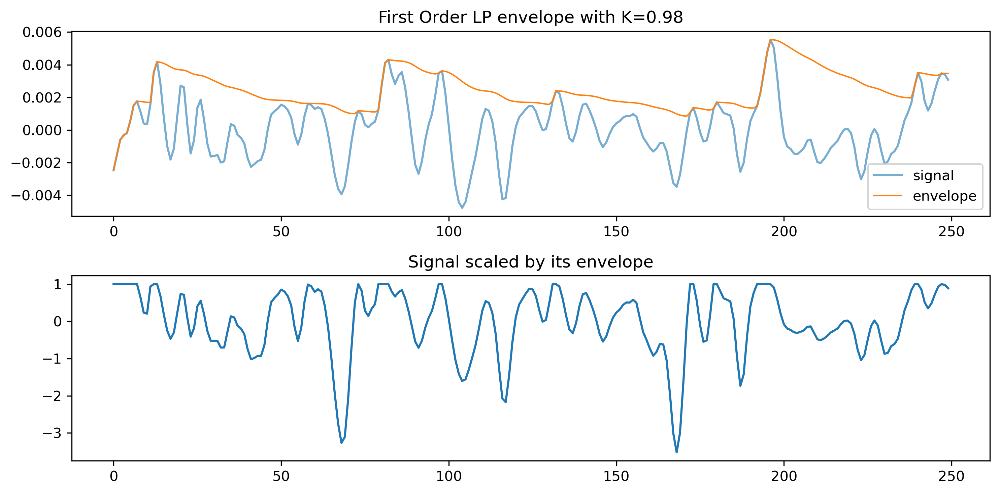

In [10]:
sample_idx = 3
env_params = {'k_env': 0.98}
k_env = env_params['k_env']
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, 600:850, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

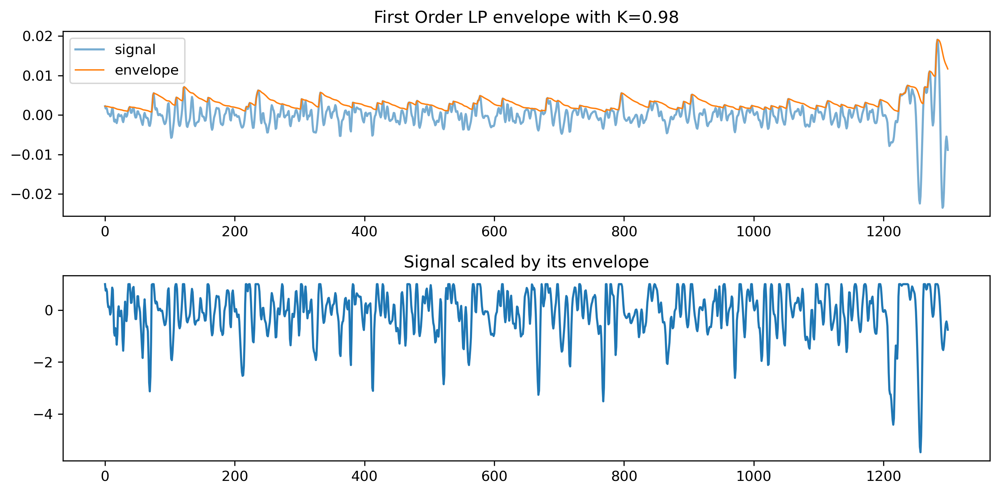

In [11]:
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, :1300, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

In [12]:
sig_scaledbyenv[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx], env[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx]/env[argmin_sig_env]

(-5.480752, -0.020566607, 0.0037525154, -5.480752)

Meaningless envelope. 

In [13]:
def envelope_third_order_lp(signal, k_env1, k_env2, k_env3):
    envelope = np.zeros(len(signal))
    for i in range(3, len(signal)-1):
        if signal[i] > signal[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env1*envelope[i-1] + k_env2*envelope[i-2] + k_env3*envelope[i-3] + (1-k_env1)*signal[i] # first order discrete time low pass filter
    return envelope

/tmp/ipykernel_5802/2914301532.py:14: RuntimeWarning: divide by zero encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


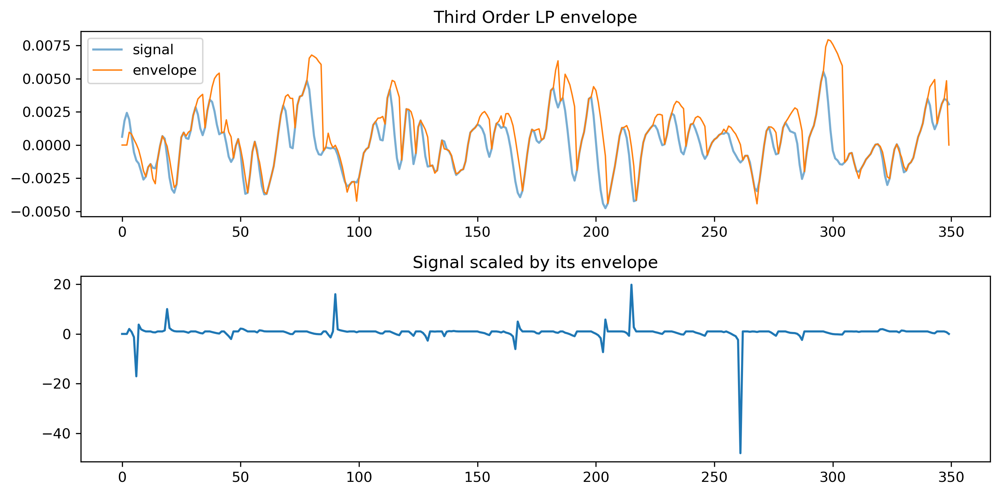

(array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  9.62100981e-04,
         8.18740577e-04,  4.23673290e-04,  6.82916405e-05, -3.71782841e-04,
        -1.06518526e-03, -1.93215206e-03, -2.38551944e-03, -1.66774739e-03,
        -1.42922916e-03, -2.54955451e-03, -2.91598244e-03, -1.09280855e-03,
        -7.39179231e-05,  6.76681171e-04,  3.38365939e-04, -8.93966389e-05,
        -1.03368480e-03, -2.14313804e-03, -3.19735246e-03, -2.95990612e-03,
        -1.15414243e-03,  5.87354531e-04,  9.47431719e-04,  6.79740071e-04,
         9.73057246e-04,  1.10530225e-03,  2.23466242e-03,  2.85928603e-03,
         3.47314985e-03,  3.67118067e-03,  3.82049675e-03,  1.30290422e-03,
         2.60547758e-03,  3.42357415e-03,  4.37874766e-03,  5.01267575e-03,
         5.27317447e-03,  5.42127226e-03,  9.24608263e-04,  9.65088315e-04,
         1.90069901e-03,  9.85166309e-04,  6.18592631e-04, -9.70143301e-04,
        -5.12651604e-05,  4.56122187e-04, -2.58883396e-04, -1.20590332e-03,
        -2.4

In [14]:
sample_idx = 3
env_params = {'k_env1': 0.5, 'k_env2': 0.3, 'k_env3': 0.2}
plot_envelope(waveforms[0, 500:850, sample_idx], title='Third Order LP envelope', envelope_function=envelope_third_order_lp, **env_params)

Meaningless envelope still. 

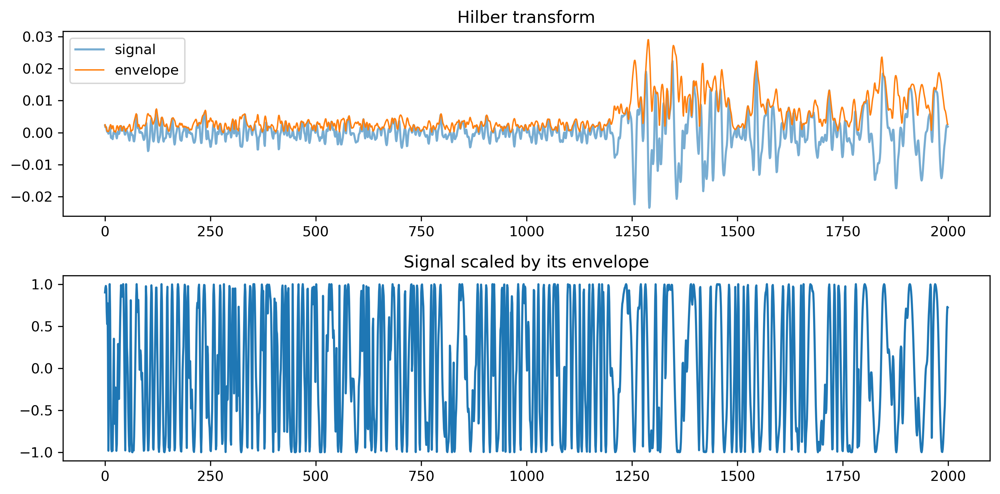

False


In [15]:
from scipy.signal import hilbert

sample_idx = 3
plot_envelope(waveforms[0, :2000, sample_idx], title='Hilber transform', envelope_function=lambda x: np.abs(hilbert(x)))

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

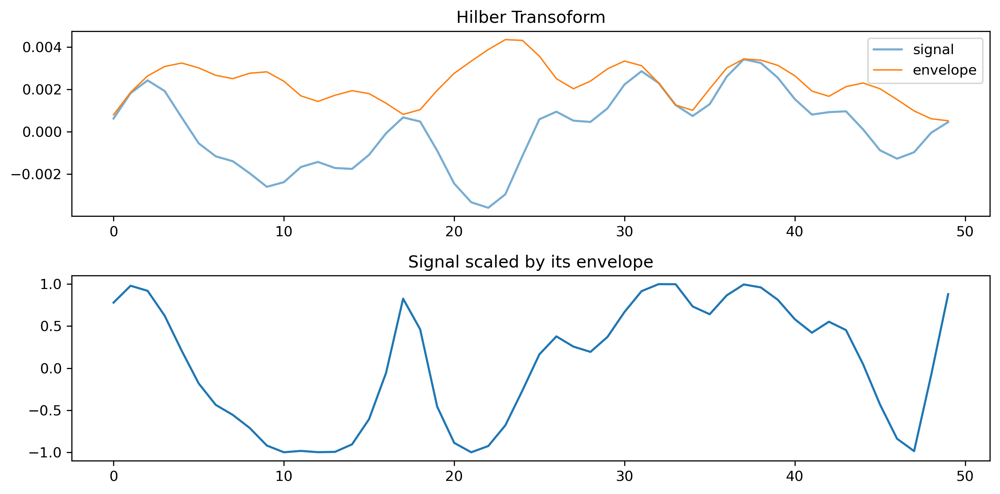

False


In [16]:
plot_envelope(waveforms[0, 500:550, sample_idx], title='Hilber Transoform', envelope_function=lambda x: np.abs(hilbert(x)))

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

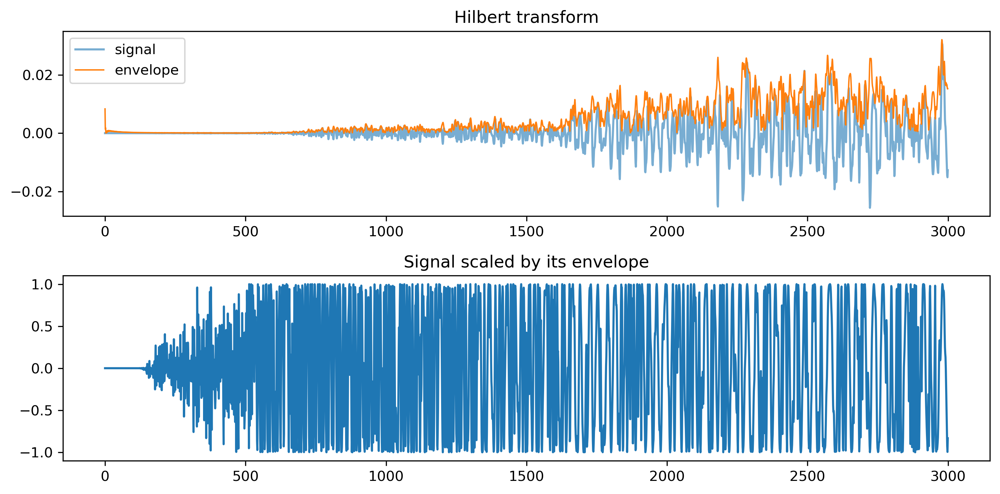

False


In [17]:
sample_idx = 0
plot_envelope(waveforms[0, :3000, sample_idx], title='Hilbert transform', envelope_function=lambda x: np.abs(hilbert(x)))

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

In [18]:
def _centered_window(x, window_len):
    assert window_len % 2, 'Centered Window has to have odd length'
    mid = window_len // 2
    pos = 0
    while pos < len(x):
        yield x[max(pos - mid, 0): min(pos + mid + 1, len(x))]
        pos += 1

def centered_max(x, window_len):
    out = [window.max() for window in _centered_window(x, window_len)]
    return np.array(out)

/tmp/ipykernel_5802/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


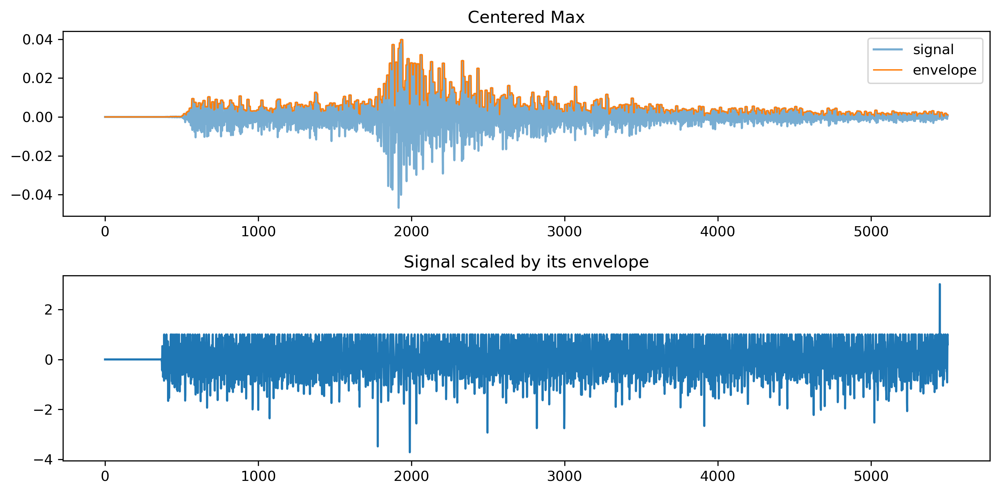

(array([0.        , 0.        , 0.        , ..., 0.00109091, 0.00109091,
        0.00109091], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.9089978 , 1.        ,
        0.60284394], dtype=float32),
 1989)

In [19]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=15)

/tmp/ipykernel_5802/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


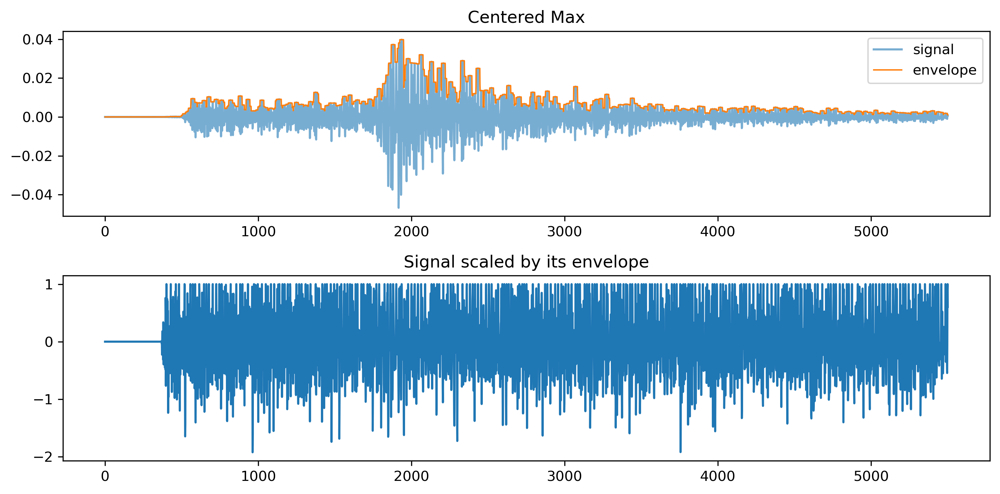

(array([0.        , 0.        , 0.        , ..., 0.00109091, 0.00109091,
        0.00109091], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.9089978 , 1.        ,
        0.60284394], dtype=float32),
 963)

In [20]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=25)

/tmp/ipykernel_5802/2914301532.py:14: RuntimeWarning: invalid value encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


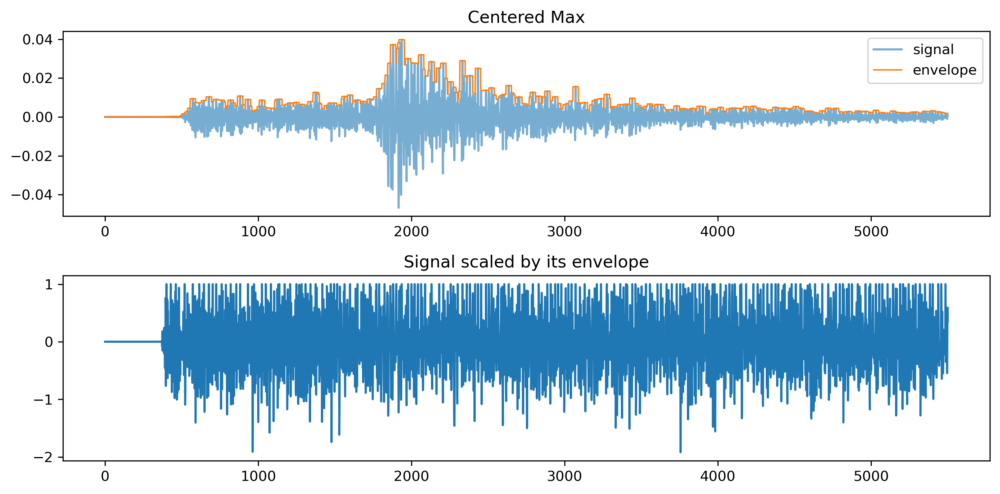

(array([0.       , 0.       , 0.       , ..., 0.0018408, 0.0018408,
        0.0018408], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.53869635, 0.5926267 ,
        0.35726142], dtype=float32),
 3756)

In [21]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

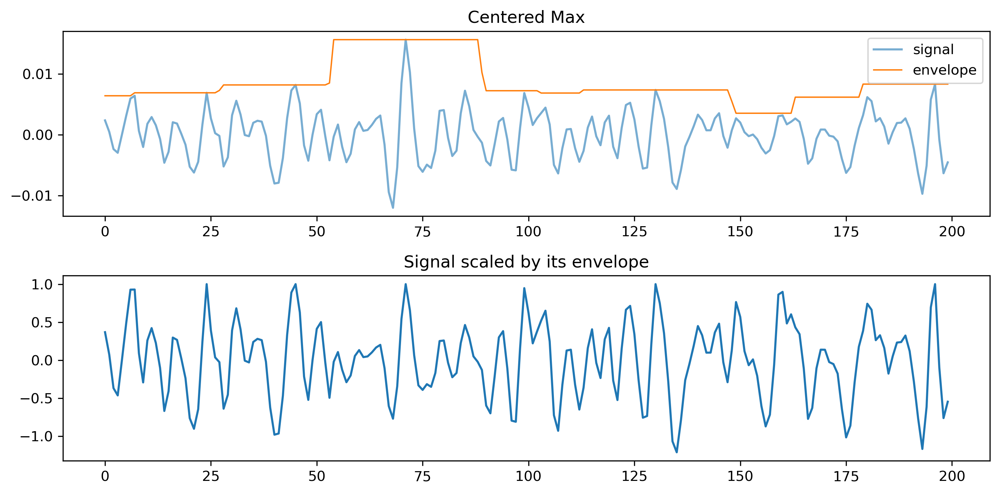

(array([0.0063992 , 0.0063992 , 0.0063992 , 0.0063992 , 0.0063992 ,
        0.0063992 , 0.0063992 , 0.00688746, 0.00688746, 0.00688746,
        0.00688746, 0.00688746, 0.00688746, 0.00688746, 0.00688746,
        0.00688746, 0.00688746, 0.00688746, 0.00688746, 0.00688746,
        0.00688746, 0.00688746, 0.00688746, 0.00688746, 0.00688746,
        0.00688746, 0.00688746, 0.00727603, 0.00817722, 0.00817722,
        0.00817722, 0.00817722, 0.00817722, 0.00817722, 0.00817722,
        0.00817722, 0.00817722, 0.00817722, 0.00817722, 0.00817722,
        0.00817722, 0.00817722, 0.00817722, 0.00817722, 0.00817722,
        0.00817722, 0.00817722, 0.00817722, 0.00817722, 0.00817722,
        0.00817722, 0.00817722, 0.00817722, 0.00848955, 0.0156042 ,
        0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 ,
        0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 ,
        0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 , 0.0156042 ,
        0.0156042 , 0.0156042 , 0.0156042 , 0.01

In [22]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, 3000:3200, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

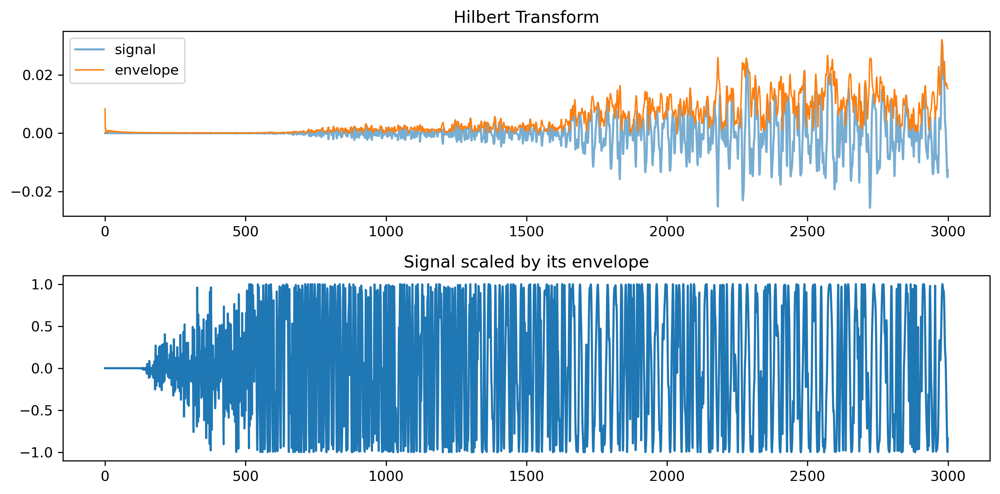

In [23]:
from scipy.signal import hilbert


sample_idx = 0
waveform = np.nan_to_num(waveforms[0, :3000, sample_idx], nan=0) # since it seems that the NaNs are at the edges of the signal, we can just replace them with 0
env, sig_scaled, _ = plot_envelope(waveform, title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

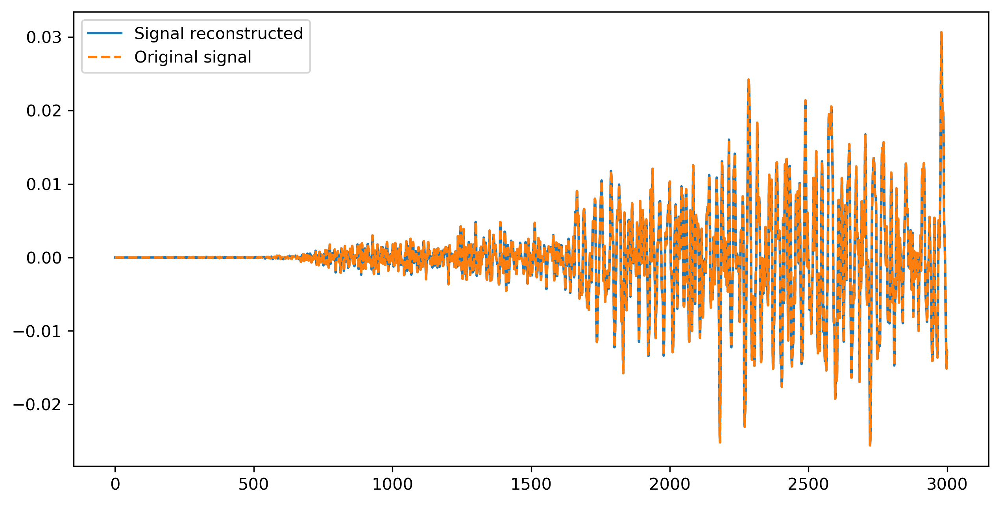

In [24]:
plt.plot(env*sig_scaled, label='Signal reconstructed')
plt.plot(waveform, '--', label='Original signal')
plt.legend()

# Envelope Statistics
Computing the mean and the standard deviation for the envelopes of the training dataset. Trying differents transformation to map envelopes in a small value range (even after normalization).

In [25]:
argmax_flat = np.nanargmax(waveforms)
argmax = np.unravel_index(argmax_flat, waveforms.shape)
np.nanmax(waveforms), argmax_flat, argmax

(36.62827, 1184670370, (2, 844, 70370))

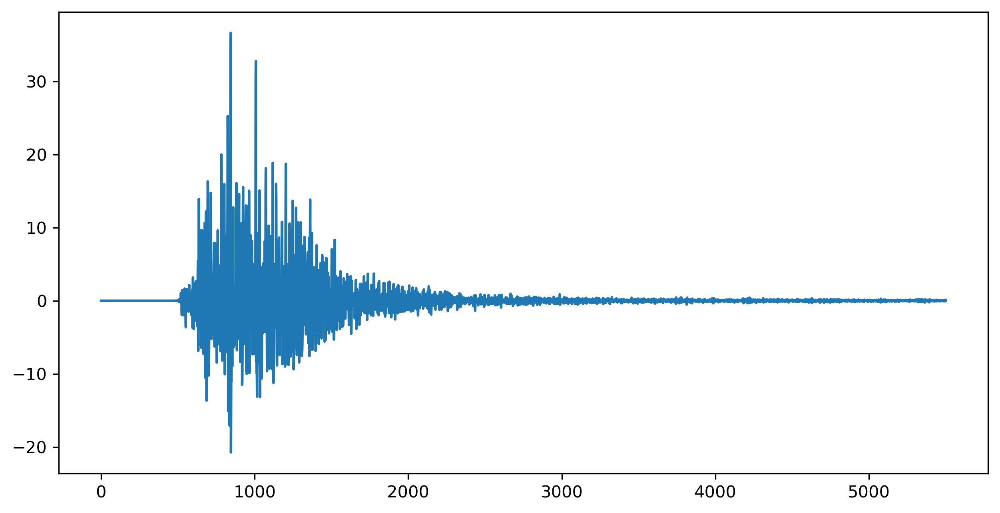

In [26]:
plt.plot(waveforms[argmax[0], :, argmax[-1]])

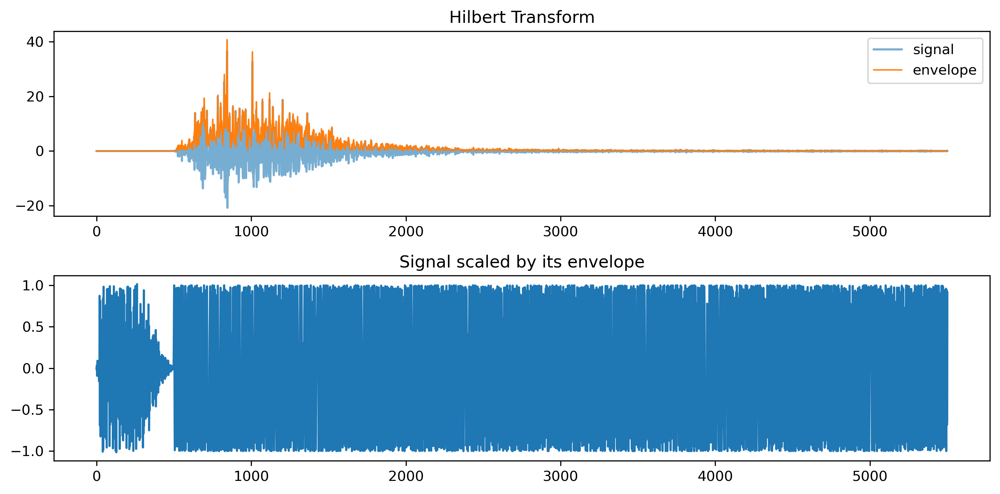

(array([0.02635395, 0.00720241, 0.00620604, ..., 0.09195945, 0.08103342,
        0.0593696 ], dtype=float32),
 array([-0.00377202, -0.02193466,  0.03454225, ..., -0.6832194 ,
        -0.6265679 ,  0.9147124 ], dtype=float32),
 128)

In [27]:
from scipy.signal import hilbert
plot_envelope(waveforms[argmax[0], :, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs((hilbert(x))))

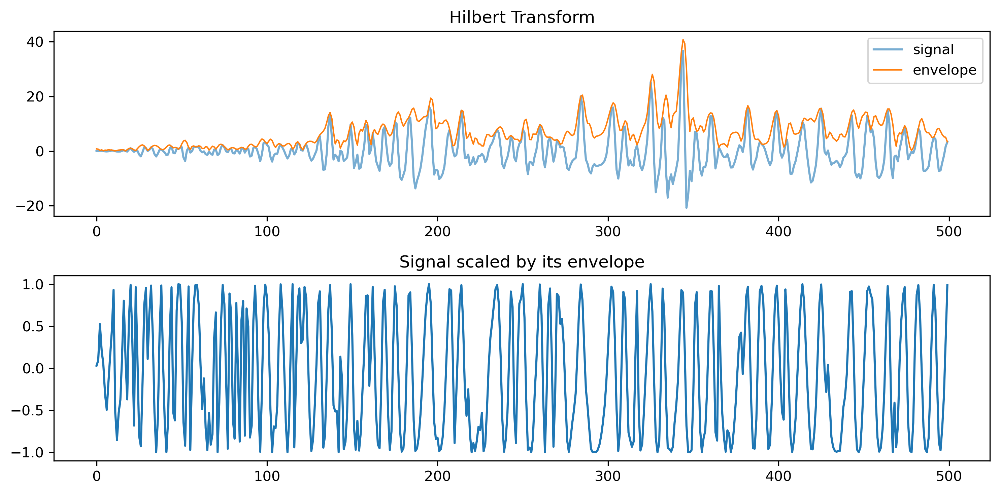

In [28]:
_,_,_ = plot_envelope(waveforms[argmax[0], 500:1000, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

### Mean and Std of a subset of the dataset 

In [29]:
n = waveforms.shape[-1]
waveforms = np.nan_to_num(waveforms, nan=0)

mean = np.mean(waveforms, axis=2)
std_dev = np.std(waveforms, axis=2)
max = np.max(waveforms, axis=2)
min = np.min(waveforms, axis=2)

n, mean.shape, std_dev.shape, max.shape, min.shape

(100000, (3, 5501), (3, 5501), (3, 5501), (3, 5501))

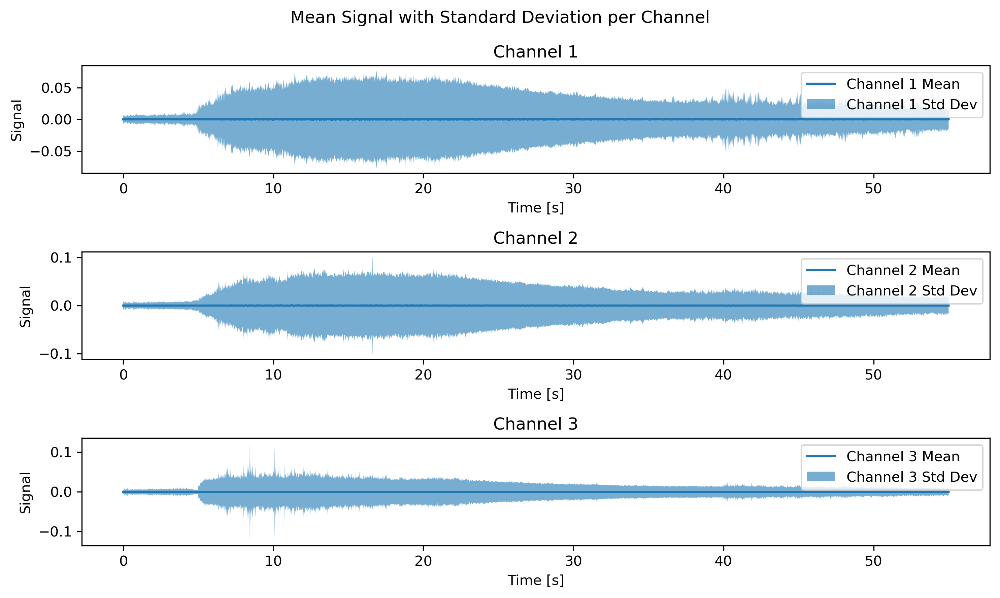

In [30]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Signal with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, mean[i] - std_dev[i], mean[i] + std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    #axs[i].plot(time_axis, max[i], label=f'Channel {i+1} Max')
    #axs[i].plot(time_axis, min[i], label=f'Channel {i+1} Min')
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [31]:
signal_statistics = {}

for i in range(mean.shape[0]):
    signal_statistics[f'ch{i+1}'] = {'mean': mean[i], 'std_dev': std_dev[i], 'max': max[i], 'min': min[i]}

signal_statistics['ch1']['mean'].shape, signal_statistics['ch1']['std_dev'].shape, signal_statistics['ch1']['max'].shape, signal_statistics['ch1']['min'].shape

((5501,), (5501,), (5501,), (5501,))

In [32]:
import pickle

with open('signal_statistics.pkl', 'wb') as f:
    pickle.dump(signal_statistics, f)

In [33]:
!ls

data.pickle	     filter.ipynb		  signal_statistics.pkl
dataset_stats.ipynb  generate_samples.ipynb	  test_dataset.ipynb
envelope.ipynb	     GM0-inference.ipynb	  test_diffusion.ipynb
evaluation.ipynb     random_data_generator.ipynb  Untitled.ipynb


## Mean and Std of the envelope of the signals

### Hilbert transform

In [34]:
envelopes = np.abs(hilbert(waveforms))
envelopes.shape

(3, 5501, 100000)

In [35]:
env_mean = np.mean(envelopes, axis=2)
env_std_dev = np.std(envelopes, axis=2)

n, env_mean.shape, env_std_dev.shape

(100000, (3, 5501), (3, 5501))

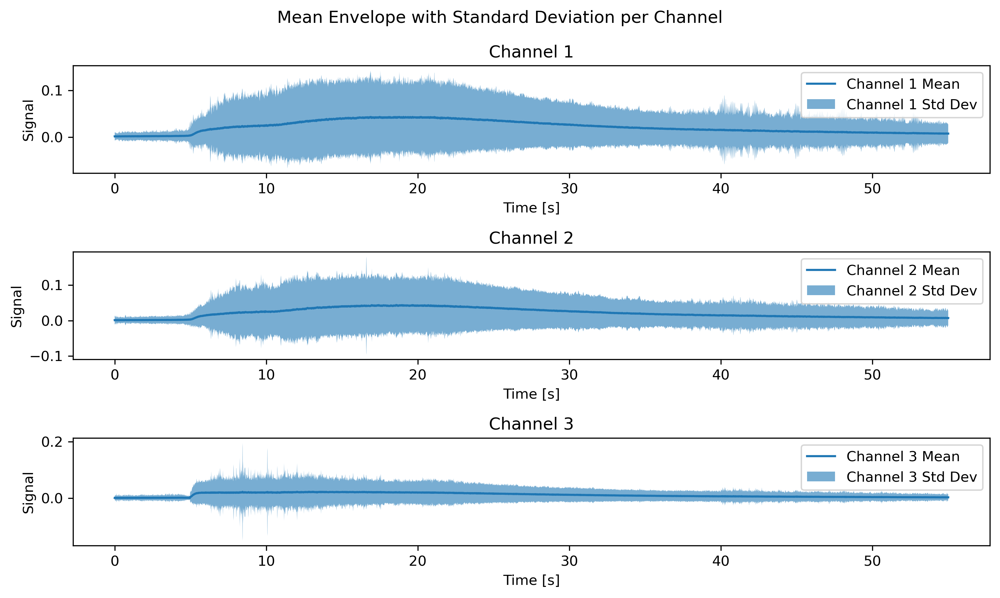

In [36]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, env_mean[i] - env_std_dev[i], env_mean[i] + env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

#### Envelope Transformation

The following is to show what happen if we normalize the envelope of the maximum signal with the envelope mean and standard deviation.

In [37]:
max_signal = waveforms[argmax[0], :, argmax[-1]]
scaled_env_max_signal = ((np.abs(hilbert(max_signal)) - env_mean[argmax[0]])/env_std_dev[argmax[0]])
scaled_env_max_signal.shape

(5501,)

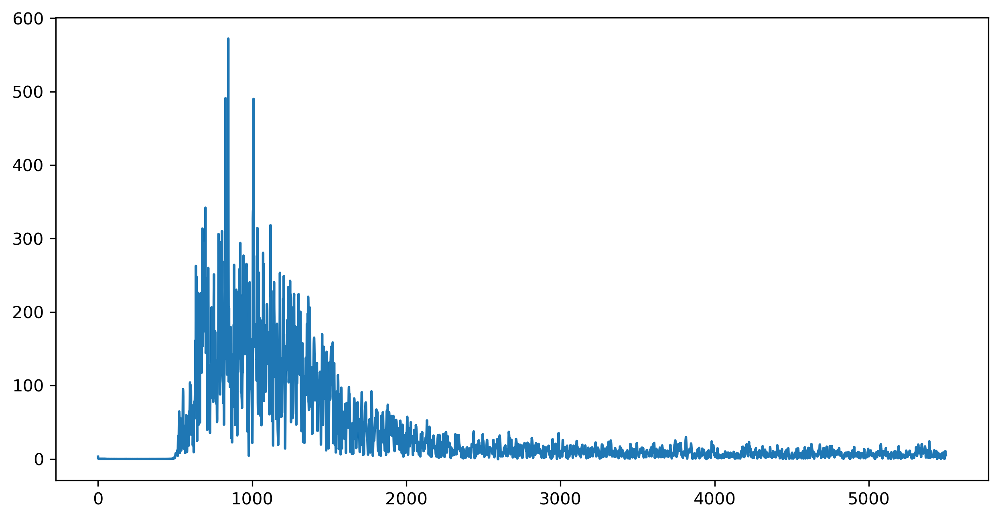

In [38]:
plt.plot(scaled_env_max_signal)

and to the envelope of a random signal. 

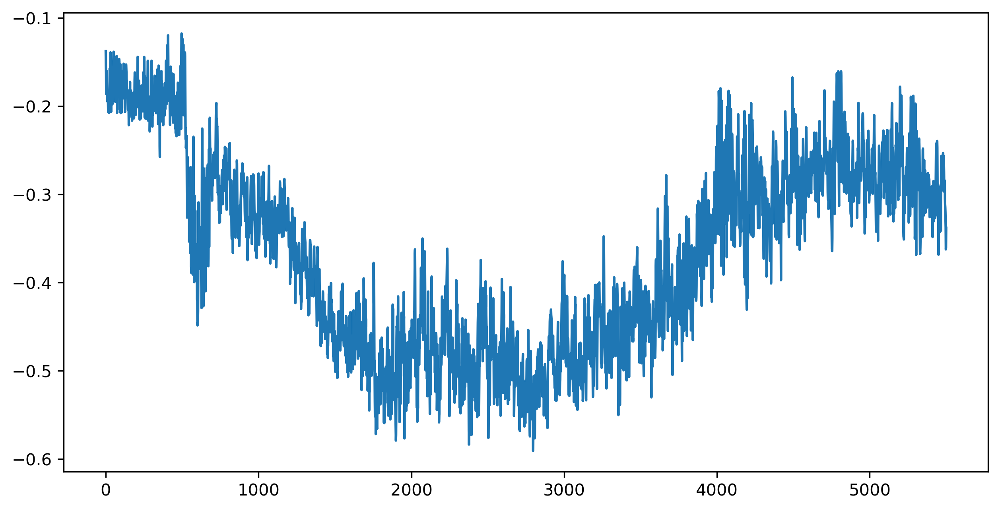

In [39]:
random_signal = waveforms[0, :, 25]
scaled_env_random_signal = ((np.abs(hilbert(random_signal)) - env_mean[0])/env_std_dev[0])
plt.plot(scaled_env_random_signal)

Appling a log tranform:

In [40]:
def log_transform(x, offset=1e-5):
    return np.log10(offset + x)

to the envelope of the maximum signal

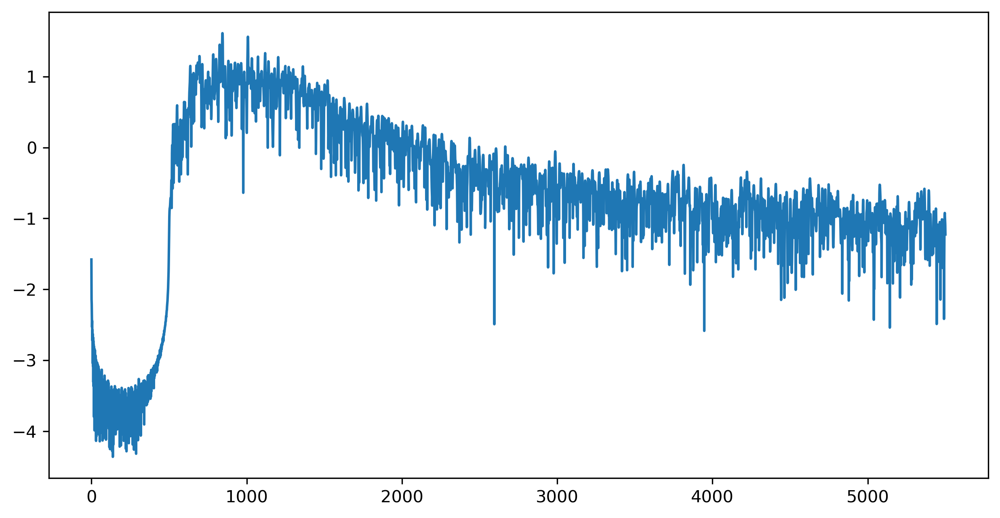

In [41]:
plt.plot(log_transform(
    (np.abs(hilbert(max_signal))), offset=1e-5)
    )

and to the envelope of the random signal 

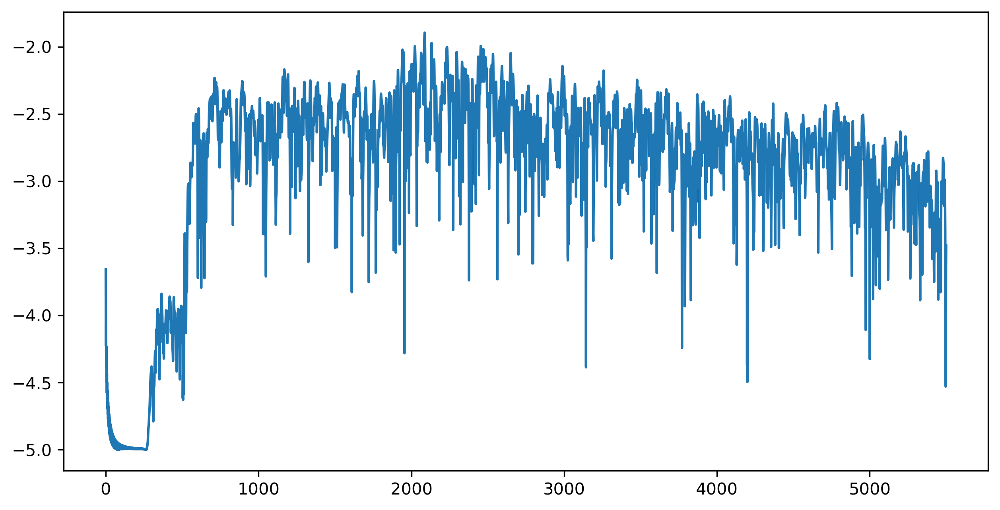

In [42]:
plt.plot(log_transform(np.abs(hilbert(random_signal))))

Range of values is now smaller. 

Let's compute the statistics of this transformed envelopes. 

In [43]:
transformed_envelopes = log_transform(envelopes)
envelopes.shape, transformed_envelopes.shape

((3, 5501, 100000), (3, 5501, 100000))

In [44]:
trans_env_mean = np.mean(transformed_envelopes, axis=2)
trans_env_std_dev = np.std(transformed_envelopes, axis=2)
trans_env_max = np.max(transformed_envelopes, axis=2)
trans_env_min = np.min(transformed_envelopes, axis=2)

n, trans_env_mean.shape, trans_env_std_dev.shape, trans_env_max.shape, trans_env_min.shape

(100000, (3, 5501), (3, 5501), (3, 5501), (3, 5501))

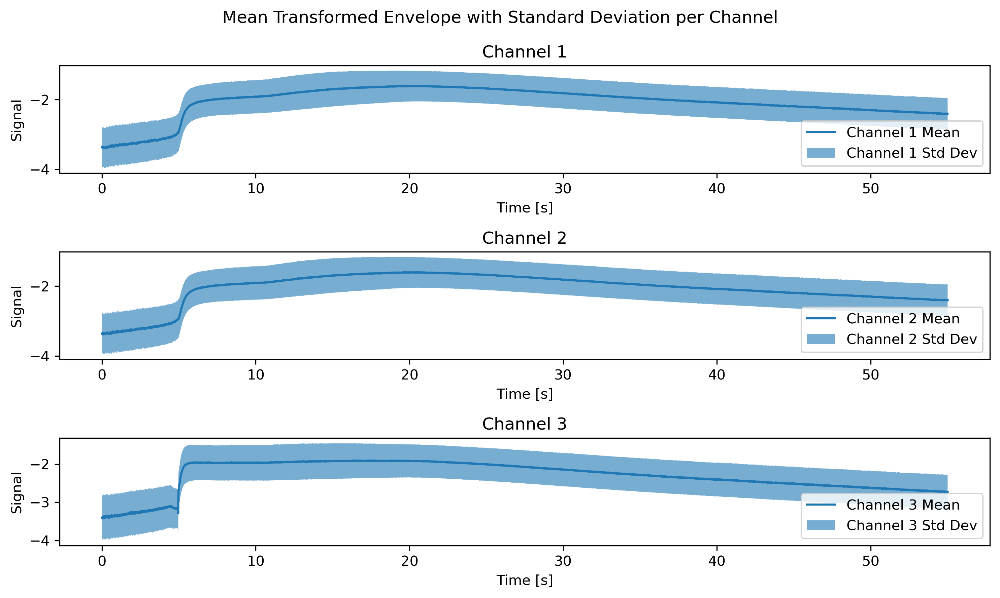

In [45]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Transformed Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , trans_env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, trans_env_mean[i] - trans_env_std_dev[i], trans_env_mean[i] + trans_env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [46]:
scaled_trans_env_max_signal = (log_transform(np.abs(hilbert(max_signal))) - trans_env_mean[argmax[0]]) / trans_env_std_dev[argmax[0]]

scaled_trans_env_max_signal.shape

(5501,)

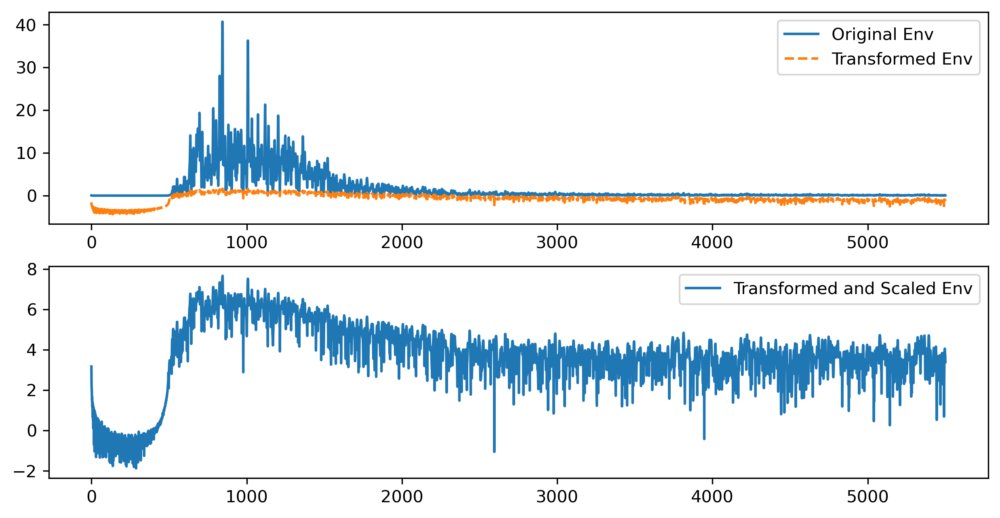

In [47]:
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(max_signal)), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(max_signal))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_trans_env_max_signal, label='Transformed and Scaled Env')
axs[1].legend()

**AREN'T WE INCREASIGN THE VARIANCE ONLY FOR THE NOISE (I.E., SMALL VALUES)?**

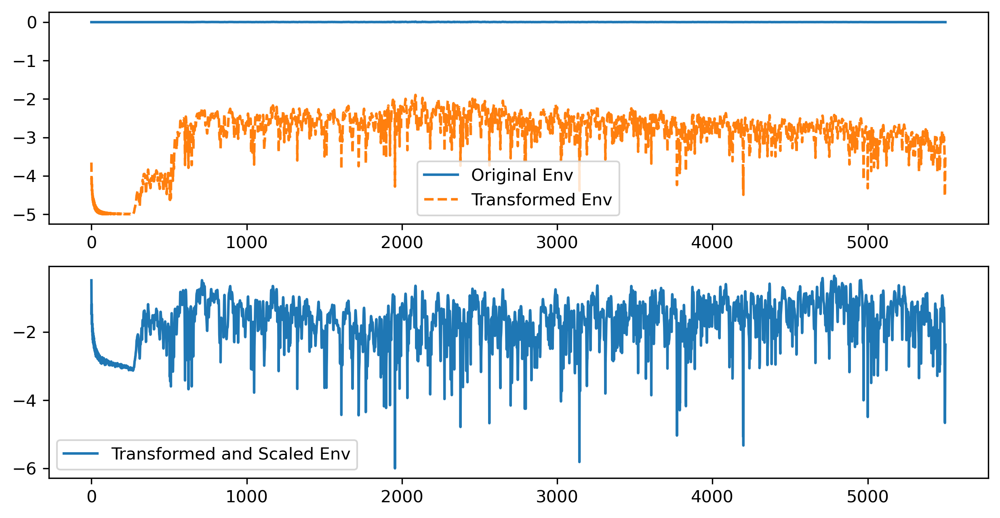

In [48]:
scaled_transf_env_random_signal = ((log_transform(np.abs(hilbert(random_signal))) - trans_env_mean[0]) / trans_env_std_dev[0])
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(random_signal)), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(random_signal))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_transf_env_random_signal, label='Transformed and Scaled Env')
axs[1].legend()

With this transformation we are able to increase the variance of our dataset, and we can use it do standardize the dataset without expanding the range of signal values.

In [49]:
np.mean(trans_env_std_dev), np.std(trans_env_std_dev), np.min(trans_env_std_dev), np.max(trans_env_std_dev)

(0.4620079, 0.03832321, 0.4254881, 0.58915013)

Here is shown how it's possible to reconstruct the transformed and scaled envelope

In [50]:
def inverse_log_transform(x, offset=1e-5):
    return 10**(x) - offset

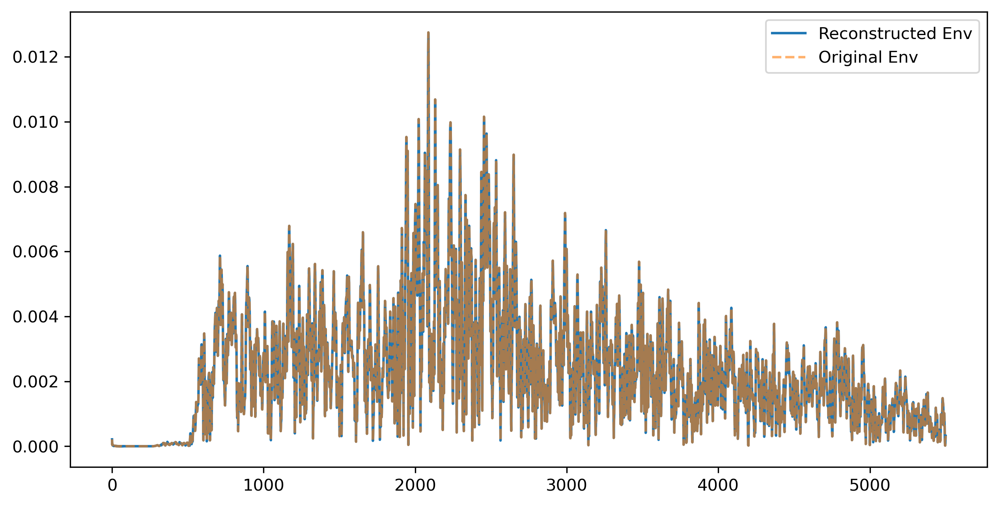

In [51]:
unscaled_trans_env_random_signal = scaled_transf_env_random_signal * trans_env_std_dev[0] + trans_env_mean[0]
plt.plot(inverse_log_transform(unscaled_trans_env_random_signal), label='Reconstructed Env')
plt.plot(np.abs(hilbert(random_signal)), '--', alpha=0.6, label='Original Env')

plt.legend()

Storing the transformed envelope statistics

In [52]:
trans_env_statistics = {}

for i in range(mean.shape[0]):
    trans_env_statistics[f'ch{i+1}'] = {'mean': trans_env_mean[i], 'std_dev': trans_env_std_dev[i], 'max': trans_env_max[i], 'min': trans_env_min[i]}

trans_env_statistics['trans_log_function_offset'] = 1e-5

trans_env_statistics['ch1']['mean'].shape, trans_env_statistics['ch1']['std_dev'].shape, trans_env_statistics['ch1']['max'].shape, trans_env_statistics['ch1']['min'].shape, trans_env_statistics['trans_log_function_offset']

((5501,), (5501,), (5501,), (5501,), 1e-05)

In [53]:
with open('trans_env_statistics.pkl', 'wb') as f:
    pickle.dump(trans_env_statistics, f)

In [54]:
env_stats_per_channel = [trans_env_statistics[f'ch{i+1}'] for i in range(3)]
env_stats_per_channel

[{'mean': array([-3.3708832, -3.3561137, -3.367269 , ..., -2.4078696, -2.4085011,
         -2.4053657], dtype=float32),
  'std_dev': array([0.58016384, 0.5801618 , 0.5787368 , ..., 0.45392263, 0.45354798,
         0.45236084], dtype=float32),
  'max': array([-0.00250003, -0.11146615, -0.10061393, ...,  0.11867633,
          0.0635194 ,  0.24388511], dtype=float32),
  'min': array([-4.999644 , -4.999224 , -4.999892 , ..., -4.931396 , -4.9960346,
         -4.9606223], dtype=float32)},
 {'mean': array([-3.3784888, -3.3595552, -3.3560266, ..., -2.4028282, -2.4036608,
         -2.404907 ], dtype=float32),
  'std_dev': array([0.58338636, 0.5857411 , 0.58261263, ..., 0.4547419 , 0.4541326 ,
         0.4545653 ], dtype=float32),
  'max': array([0.20530248, 0.2616946 , 0.30592483, ..., 0.1406789 , 0.12369651,
         0.15114829], dtype=float32),
  'min': array([-4.999316 , -4.99994  , -4.999242 , ..., -4.9534187, -4.950719 ,
         -4.78105  ], dtype=float32)},
 {'mean': array([-3.4016175, -

In [55]:
np.array([env_stats_per_channel[i]['mean'] for i in range(3)]).shape

(3, 5501)